### Numerické řešení pohybu aut

In [1]:
using Plots
pyplot();

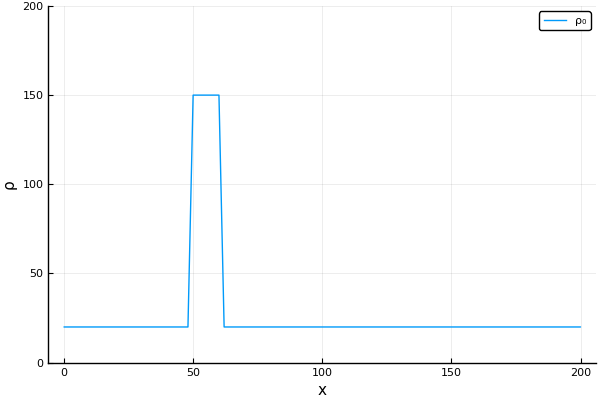

In [2]:
Nx = 101;                   # Pocet bodu site na intervalu [0,1]

x = 0:200/(Nx-1):200;       # Souradnice bodu site
xc = (x[1:end-1] + x[2:end]) / 2.0

function ρ0(x)
    """Definice pocatecni podminky"""
    if x<50.0 || x>60.
        return 20.
    else
        return 150.
    end
end

plot(x,[ρ0(xi) for xi in x], label="ρ₀")
ylims!(0,200); xlabel!("x"); ylabel!("ρ")

**Protiproudové (upwind) schéma**

In [3]:
vmax = 130.
ρmax = 200.

v(ρ) = vmax * (1-ρ/ρmax)
f(ρ) = ρ * v(ρ)

f (generic function with 1 method)

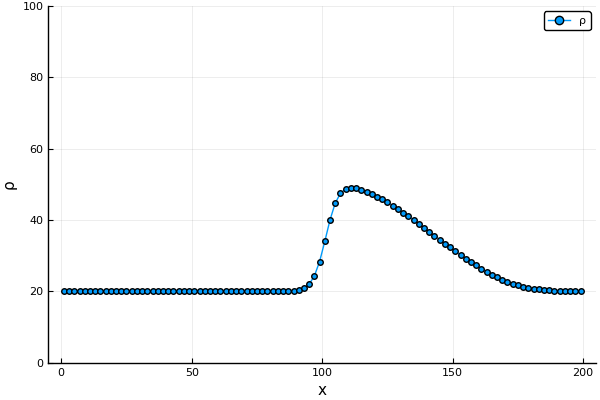

In [4]:
dx = x[2]-x[1];      # Velikost prostoroveho 
dt = 0.5 * dx / vmax  # Velikost casoveho kroku

ρ    = [ρ0(xi) for xi in xc]
ρNew = copy(ρ)

t = 0
Tend = 1.0;

pocet_iteraci = round(Int, Tend / dt) # Vypocet provedeme do casu priblizne Tend

function flux_upwind(ρl, ρr)
    if ρl ≈ ρr
        a = f(ρl+1.e-6)/1.e-6
    else
        a = (f(ρl) - f(ρr)) / (ρl - ρr)
    end
    
    if a>0
        return f(ρl)
    elseif a<0 
        return f(ρr)
    else 
        return 0
    end
end

for n = 1:pocet_iteraci
    global t += dt
    
    for i = 2:Nx-2
        ρNew[i] = ρ[i] - dt / dx * ( flux_upwind(ρ[i],ρ[i+1]) - flux_upwind(ρ[i-1],ρ[i]) )
    end

    for i = 2:Nx-2
        ρ[i] = ρNew[i]
    end

end

ρ_upwind = copy(ρ)

plot(xc,ρ_upwind, marker=:circle, label="ρ")
ylims!(0,100); xlabel!("x"); ylabel!("ρ")
